In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv("dataset.csv")
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [3]:
df.shape

(112634, 17)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         112634 non-null  object 
 1   County                                             112634 non-null  object 
 2   City                                               112634 non-null  object 
 3   State                                              112634 non-null  object 
 4   Postal Code                                        112634 non-null  int64  
 5   Model Year                                         112634 non-null  int64  
 6   Make                                               112634 non-null  object 
 7   Model                                              112614 non-null  object 
 8   Electric Vehicle Type                              112634 non-null  object

In [5]:
df.isna().sum()

VIN (1-10)                                             0
County                                                 0
City                                                   0
State                                                  0
Postal Code                                            0
Model Year                                             0
Make                                                   0
Model                                                 20
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                         0
Base MSRP                                              0
Legislative District                                 286
DOL Vehicle ID                                         0
Vehicle Location                                      24
Electric Utility                                     443
2020 Census Tract                                      0
dtype: int64

In [6]:
df['Model'] = df['Model'].fillna('Unknown')
df['Legislative District'] = df['Legislative District'].fillna(df['Legislative District'].mode()[0])
df['Vehicle Location'] = df['Vehicle Location'].fillna(df['Vehicle Location'].mode()[0])
df['Electric Utility'] = df['Electric Utility'].fillna('Unknown')

In [7]:
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,41.0,198968248,POINT (-81.80023 24.5545),Unknown,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,41.0,5204412,POINT (-114.57245 35.16815),Unknown,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [8]:
df.isna().sum()

VIN (1-10)                                           0
County                                               0
City                                                 0
State                                                0
Postal Code                                          0
Model Year                                           0
Make                                                 0
Model                                                0
Electric Vehicle Type                                0
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0
Electric Range                                       0
Base MSRP                                            0
Legislative District                                 0
DOL Vehicle ID                                       0
Vehicle Location                                     0
Electric Utility                                     0
2020 Census Tract                                    0
dtype: int64

# Visualization

## Univariate 

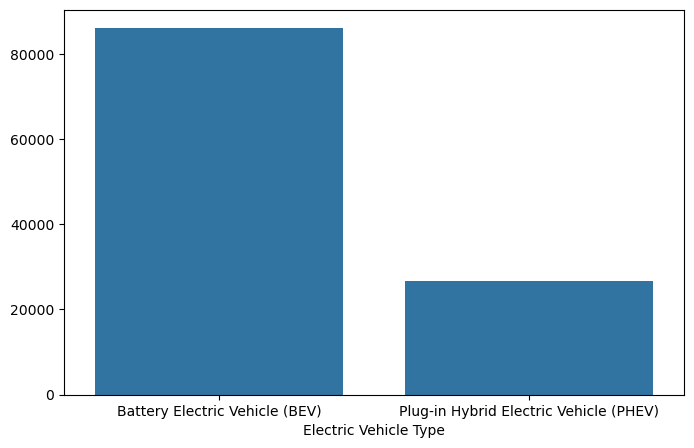

In [11]:
Count = df['Electric Vehicle Type'].value_counts()
plt.figure(figsize=(8,5))
sns.barplot(x=Count.index, y=Count.values)
plt.show()

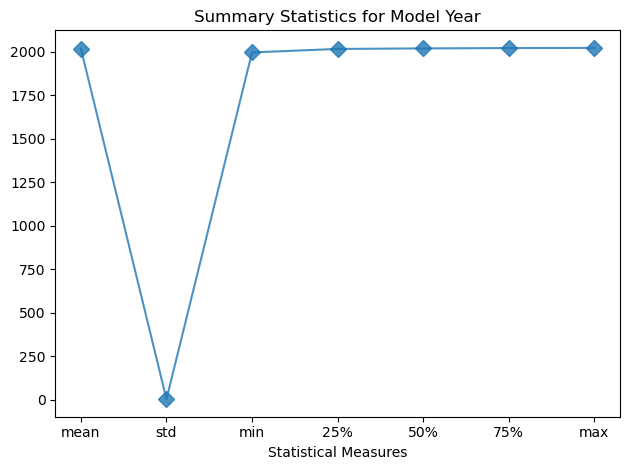

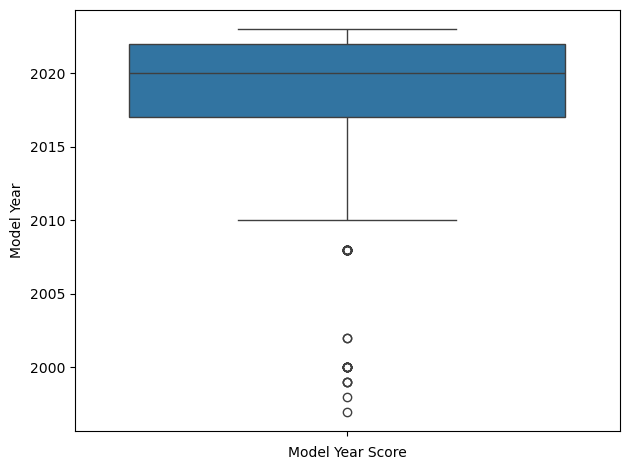

In [12]:
df['Model Year'].describe()[1:].plot( alpha=0.8, marker='D', markersize=8)
plt.title(f'Summary Statistics for {'Model Year'}')
plt.xlabel('Statistical Measures')
plt.tight_layout()
plt.show()
    
# Boxplot
sns.boxplot(df['Model Year'])
plt.xlabel(f'{'Model Year'} Score')
plt.tight_layout()
plt.show()

<Axes: xlabel='Electric Range', ylabel='Count'>

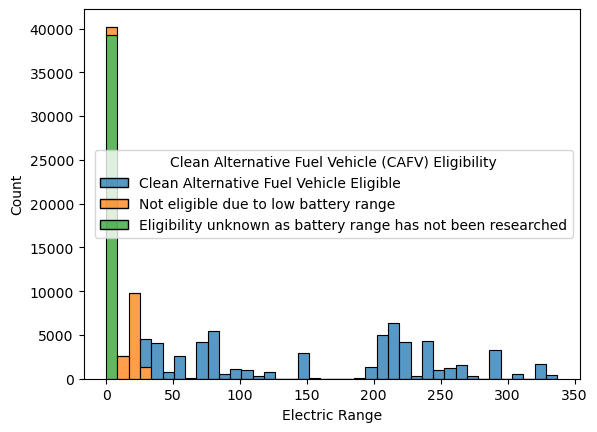

In [13]:
sns.histplot(data=df, x="Electric Range", hue="Clean Alternative Fuel Vehicle (CAFV) Eligibility", multiple="stack")


In [14]:
df['Electric Vehicle Type'].value_counts()

Electric Vehicle Type
Battery Electric Vehicle (BEV)            86044
Plug-in Hybrid Electric Vehicle (PHEV)    26590
Name: count, dtype: int64

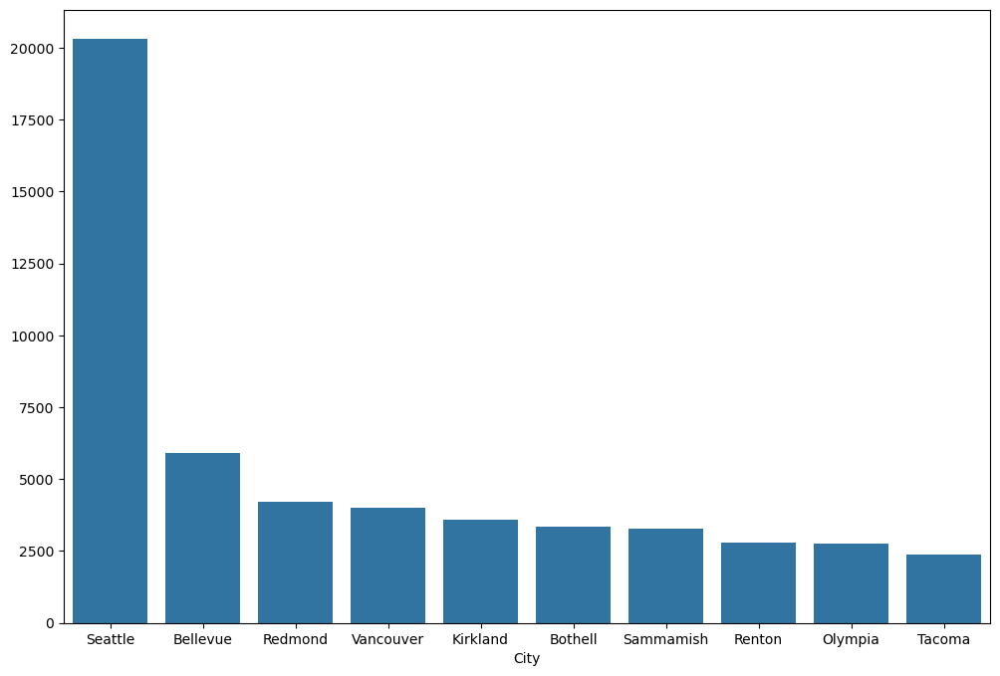

In [15]:
city_count = df['City'].value_counts().head(10)
plt.figure(figsize=(12,8))
sns.barplot(x=city_count.index, y=city_count.values)
plt.show()

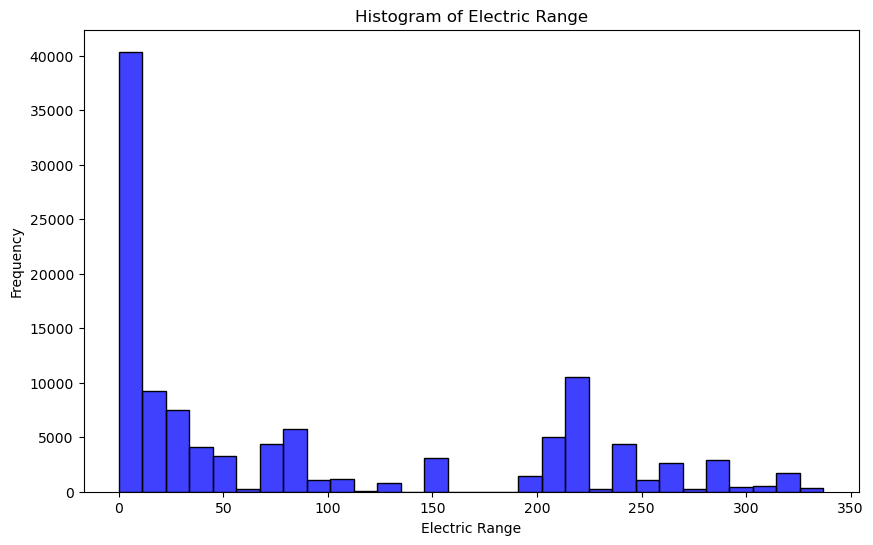

In [16]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Electric Range'], kde=False, bins=30, color='blue')
plt.title('Histogram of Electric Range')
plt.xlabel('Electric Range')
plt.ylabel('Frequency')
plt.show()

C:\Users\Dell\AppData\Local\Temp\ipykernel_3504\1861750134.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Electric Vehicle Type', y='Base MSRP', data=df, palette='Set3')


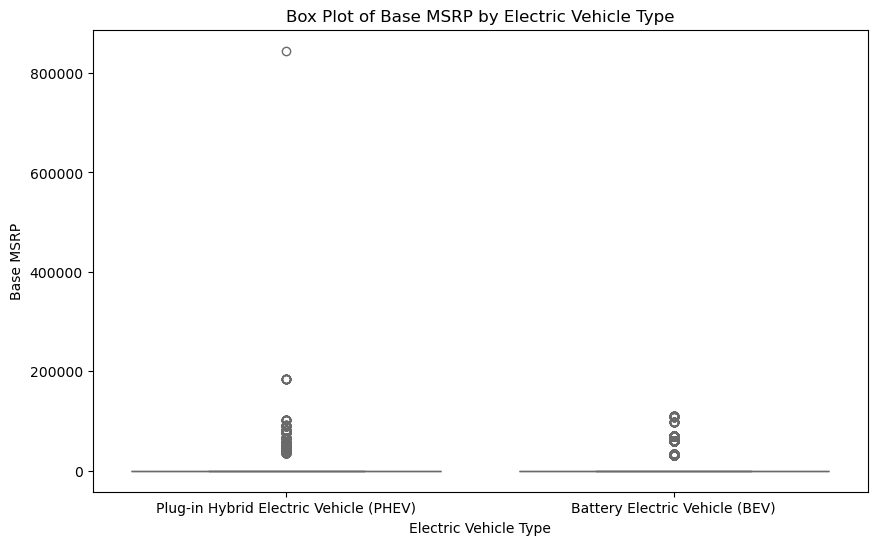

In [17]:
# Box plot
plt.figure(figsize=(10, 6))
sns.boxplot(x='Electric Vehicle Type', y='Base MSRP', data=df, palette='Set3')
plt.title('Box Plot of Base MSRP by Electric Vehicle Type')
plt.show()


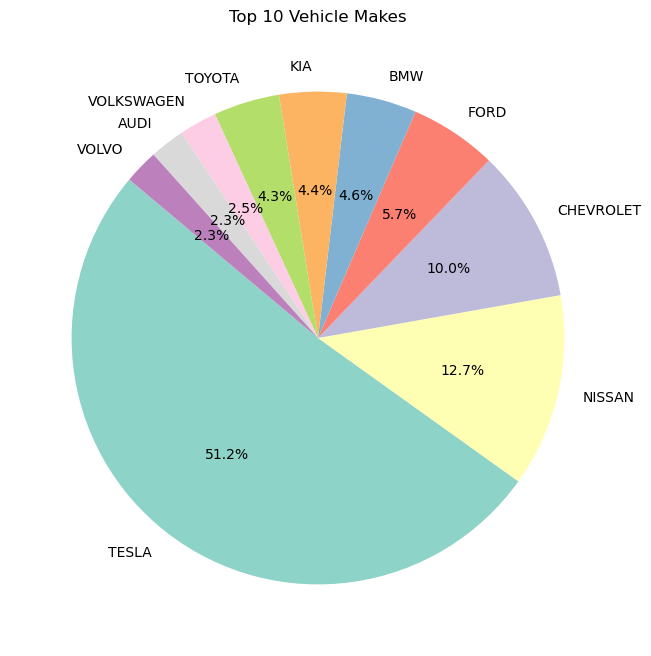

In [18]:
# Pie chart
make_counts = df['Make'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(make_counts[:10], labels=make_counts.index[:10], autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set3'))
plt.title('Top 10 Vehicle Makes')
plt.show()

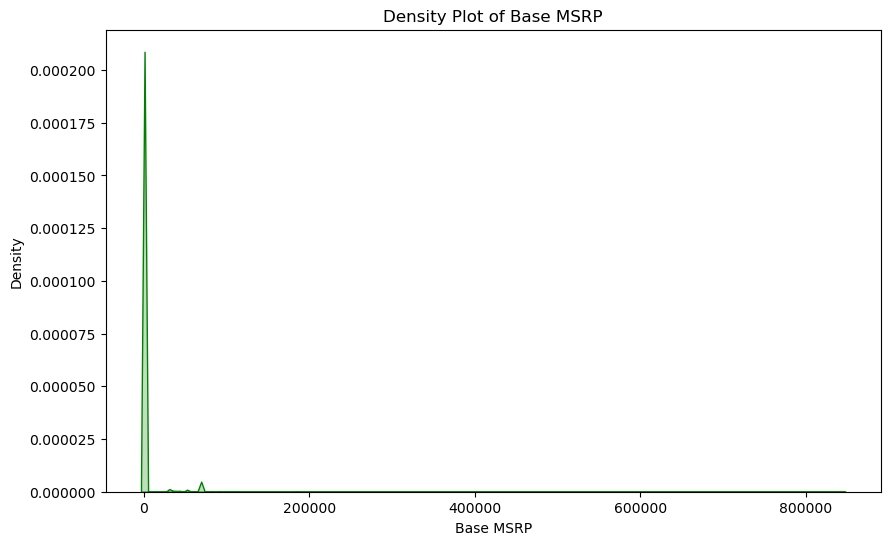

In [19]:
# Density Plot (KDE) for 'Base MSRP'
plt.figure(figsize=(10, 6))
sns.kdeplot(df['Base MSRP'], fill=True, color='green')
plt.title('Density Plot of Base MSRP')
plt.xlabel('Base MSRP')
plt.ylabel('Density')
plt.show()

## Bivariate

C:\Users\Dell\AppData\Local\Temp\ipykernel_3504\2512696409.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_electric_range.index, y=avg_electric_range.values, palette='Set3')


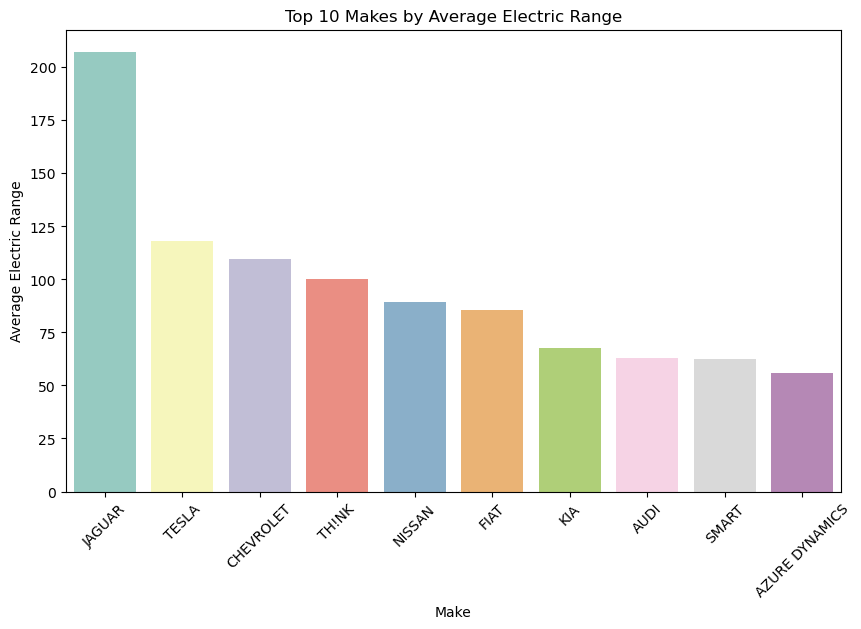

In [21]:
# Bar Plot for average 'Electric Range' by 'Make'
plt.figure(figsize=(10, 6))
avg_electric_range = df.groupby('Make')['Electric Range'].mean().sort_values(ascending=False).head(10)
sns.barplot(x=avg_electric_range.index, y=avg_electric_range.values, palette='Set3')
plt.title('Top 10 Makes by Average Electric Range')
plt.xticks(rotation=45)
plt.xlabel('Make')
plt.ylabel('Average Electric Range')
plt.show()


<Axes: xlabel='Electric Range', ylabel='Base MSRP'>

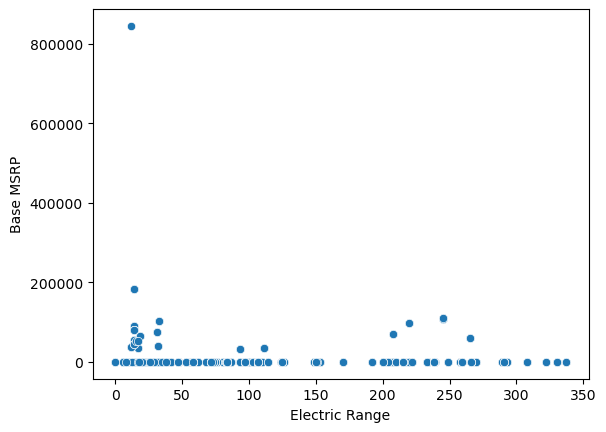

In [22]:
sns.scatterplot(data=df, x="Electric Range", y="Base MSRP")

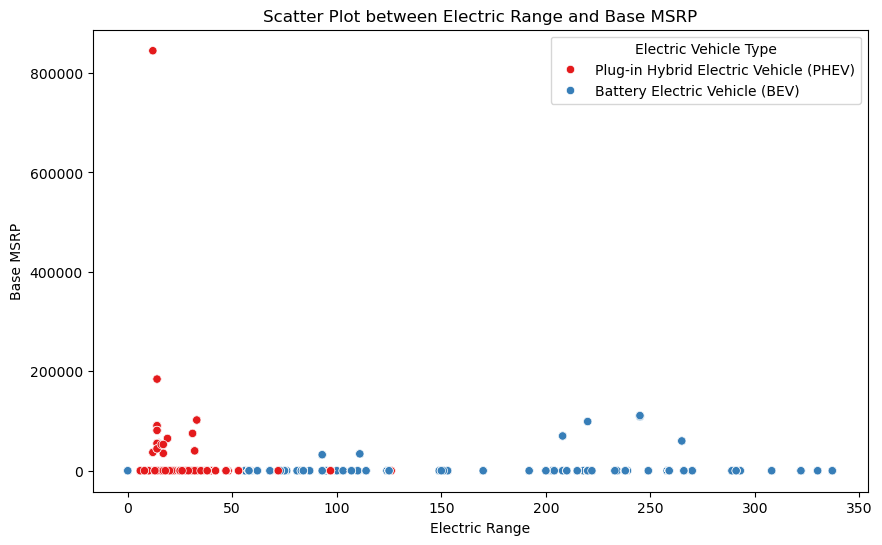

In [23]:
# Scatter plot between 'Electric Range' and 'Base MSRP'
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Electric Range', y='Base MSRP', data=df, hue='Electric Vehicle Type', palette='Set1')
plt.title('Scatter Plot between Electric Range and Base MSRP')
plt.xlabel('Electric Range')
plt.ylabel('Base MSRP')
plt.show()


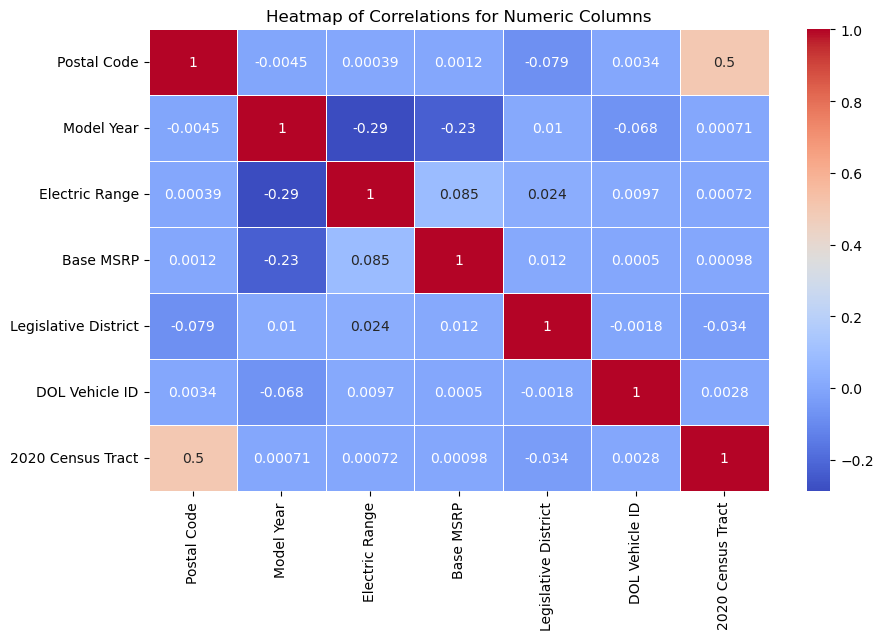

In [24]:
numeric_data = df.select_dtypes(include=['float64', 'int64'])

# Heatmap of correlations
plt.figure(figsize=(10, 6))
correlation_matrix = numeric_data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Heatmap of Correlations for Numeric Columns')
plt.show()

C:\Users\Dell\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Dell\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Dell\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
C:\Users\Dell\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\Dell\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
C:\Users\Dell\anaconda3\Lib\site-packages\seaborn\axisgrid.py:1615: UserWarning: Ignoring `palette` because no `hue` variable

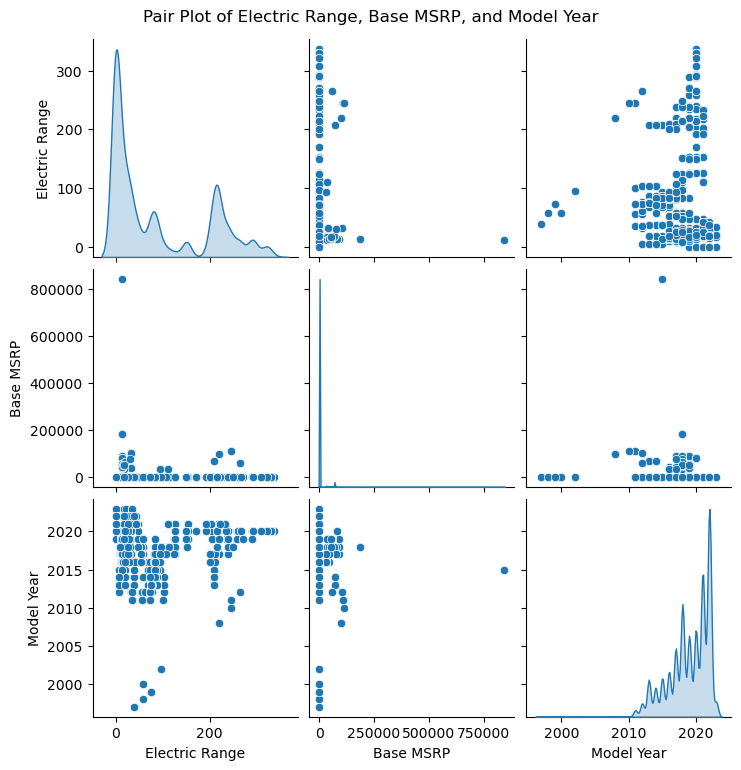

In [25]:
# Pair Plot
sns.pairplot(df[['Electric Range', 'Base MSRP', 'Model Year']], diag_kind='kde', palette='Set1')
plt.suptitle('Pair Plot of Electric Range, Base MSRP, and Model Year', y=1.02)
plt.show()

C:\Users\Dell\AppData\Local\Temp\ipykernel_3504\2757086322.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Electric Vehicle Type', y='Base MSRP', data=df, palette='Set2')


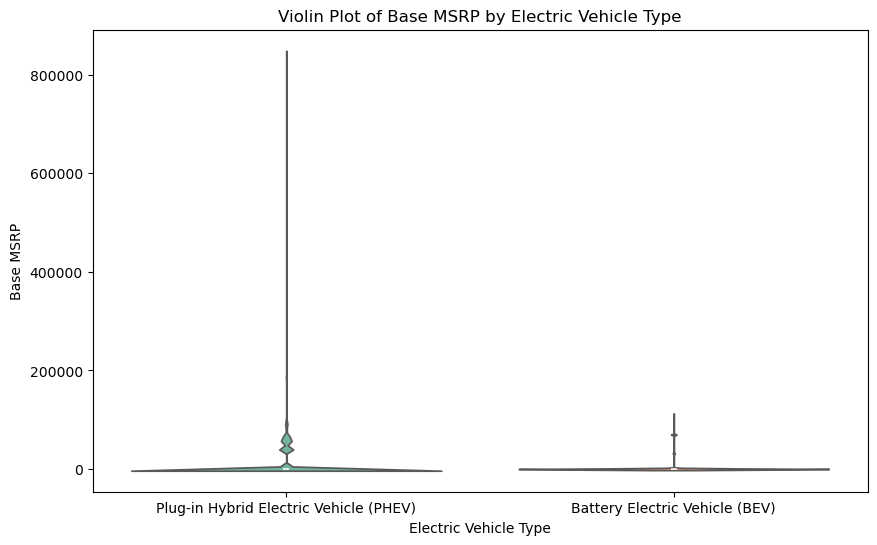

In [26]:
# Violin Plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='Electric Vehicle Type', y='Base MSRP', data=df, palette='Set2')
plt.title('Violin Plot of Base MSRP by Electric Vehicle Type')
plt.show()


C:\Users\Dell\AppData\Local\Temp\ipykernel_3504\1603749508.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df['Electric Vehicle Type'], palette='Set2')


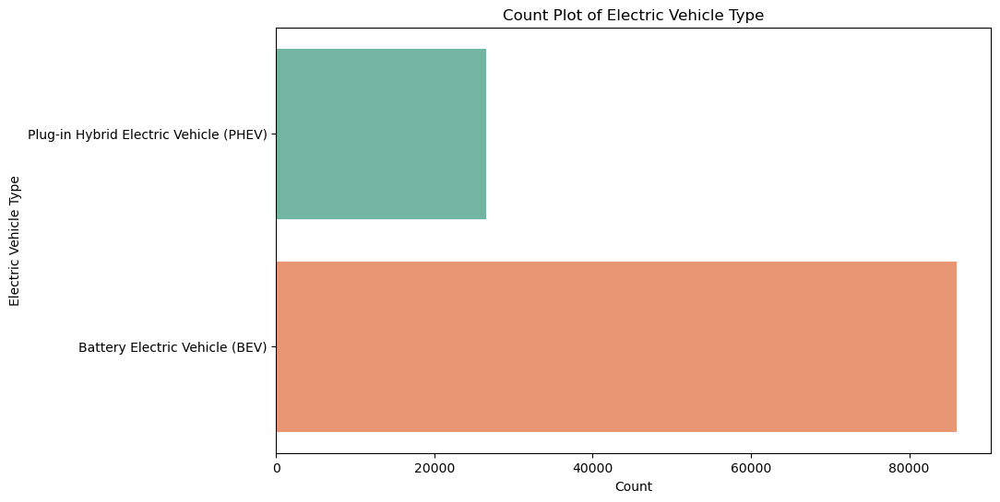

In [27]:
# Count plot
plt.figure(figsize=(10, 6))
sns.countplot(y=df['Electric Vehicle Type'], palette='Set2')
plt.title('Count Plot of Electric Vehicle Type')
plt.xlabel('Count')
plt.ylabel('Electric Vehicle Type')
plt.show()

# Task 2

In [29]:
! pip install plotly

In [30]:
import plotly.express as px

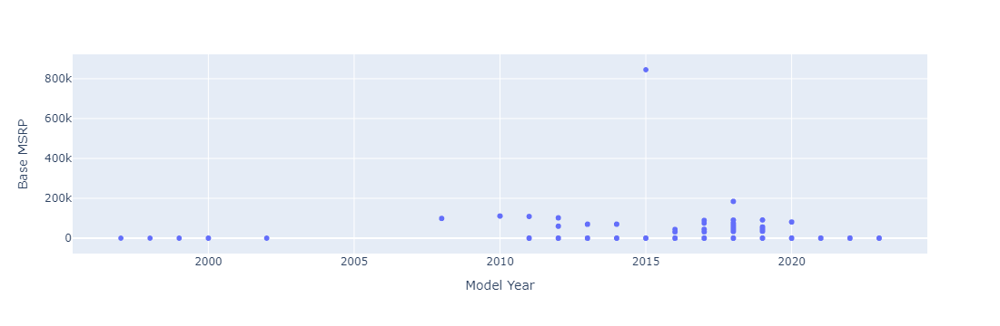

In [31]:
px.scatter(df, x='Model Year', y='Base MSRP')

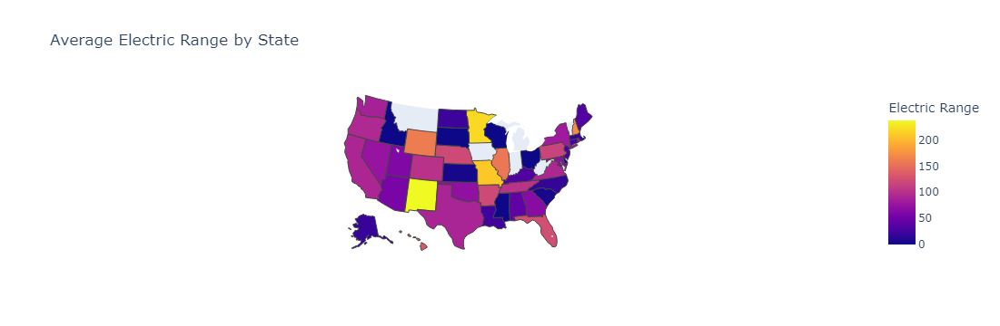

In [32]:
state_avg_range = df.groupby('State')['Electric Range'].mean().reset_index()

fig = px.choropleth(state_avg_range, 
                    locations='State',  
                    locationmode='USA-states',  
                    color='Electric Range',  
                    scope='usa', 
                    title='Average Electric Range by State')

fig.show()


# Task 3

In [34]:
import bar_chart_race as bcr

In [35]:
df['Make'].unique()

array(['TOYOTA', 'CHEVROLET', 'NISSAN', 'FORD', 'TESLA', 'KIA', 'AUDI',
       'FIAT', 'BMW', 'PORSCHE', 'CADILLAC', 'HONDA', 'MITSUBISHI',
       'CHRYSLER', 'RIVIAN', 'HYUNDAI', 'VOLVO', 'VOLKSWAGEN',
       'MERCEDES-BENZ', 'JEEP', 'MINI', 'SMART', 'SUBARU', 'POLESTAR',
       'LUCID MOTORS', 'LINCOLN', 'JAGUAR', 'FISKER', 'LAND ROVER',
       'LEXUS', 'TH!NK', 'GENESIS', 'BENTLEY', 'AZURE DYNAMICS'],
      dtype=object)

In [36]:
ev_count=df.groupby(['Model Year', 'Make']).size().unstack(fill_value = 0)
bcr.bar_chart_race(
    df=ev_count,
    filename='ev_racing_bar_plot.gif',
    cmap='tab10',
    sort='desc',
    n_bars=10,
    period_label={'x':0.5,'y':0.95},
    period_length=1000,
    bar_label_size=0,
    tick_label_size=8,
    figsize=(6,4)
)
print('Racing bar plot')

C:\Users\Dell\anaconda3\Lib\site-packages\bar_chart_race\_make_chart.py:889: FutureWarning:

Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.

C:\Users\Dell\anaconda3\Lib\site-packages\bar_chart_race\_make_chart.py:286: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\Dell\anaconda3\Lib\site-packages\bar_chart_race\_make_chart.py:287: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\Dell\anaconda3\Lib\site-packages\bar_chart_race\_make_chart.py:226: UserWarning:

Some of your columns never make an appearance in the animation. To reduce color repetition, set `filter_column_colors` to `True`

MovieWriter imagemagick unavailable; using Pillow instead.


Racing bar plot


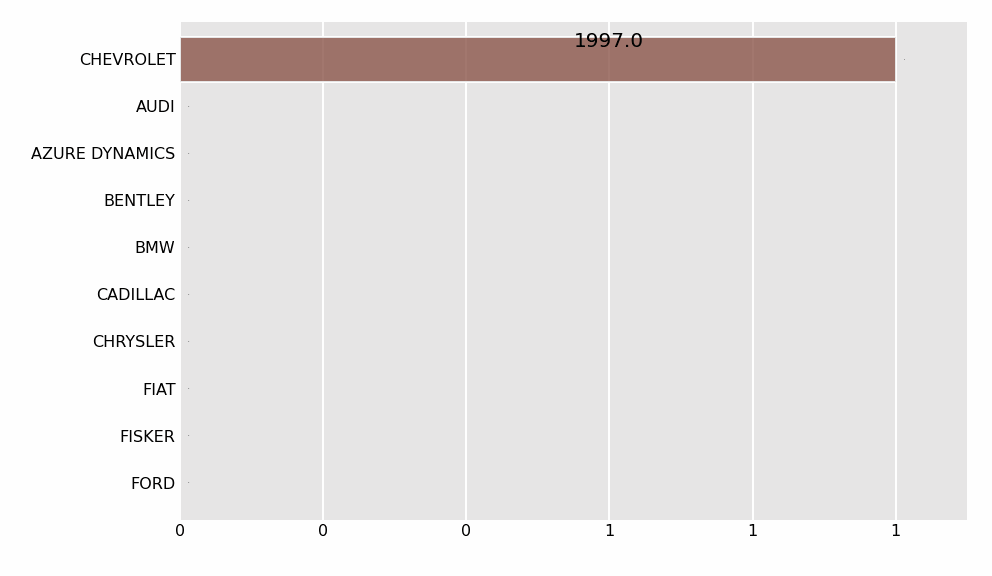

In [38]:
from IPython.display import Image
Image(filename='ev_racing_bar_plot.gif')
